# Computer Vision color spaces

### Import statements

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

### To edit an image making a copy of it is always a good idea!

In [2]:
# Load an image
# And make a copy of the original image to avoid manipulating the original image
img = cv2.imread("img/purple-flowers.jpg")
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
flowers_copy  = rgb_img.copy()

In [3]:
def showimage(img):
    plt.figure(figsize = (15,20))
    plt.imshow(img)

[Hint](# "Numpy .copy function") 

## Color Spaces

### BGR Spliting the color channels

In [50]:
# Load a color image and split in is different B, G and R channels
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
flowers_copy  = rgb_img.copy()
b_f, g_f, r_f = cv2.split(flowers_copy) 
b_img = flowers_copy[:,:,0]
g_img = flowers_copy[:,:,1]
r_img = flowers_copy[:,:,2]

In [34]:
b_f

array([[176, 196, 212, ..., 164, 176, 171],
       [197, 218, 232, ..., 165, 184, 193],
       [215, 232, 242, ..., 164, 184, 196],
       ...,
       [ 63,  77,  87, ...,  34,  21,  16],
       [ 64,  70,  66, ...,  35,  21,  24],
       [ 55,  56,  41, ...,  32,  32,  33]], dtype=uint8)

In [35]:
g_f

array([[138, 165, 182, ..., 132, 133, 125],
       [150, 168, 179, ..., 105, 114, 122],
       [154, 172, 181, ...,  90, 104, 121],
       ...,
       [ 51,  68,  75, ...,  70,  58,  58],
       [ 44,  64,  71, ...,  56,  34,  38],
       [ 31,  54,  57, ...,  37,  31,  38]], dtype=uint8)

In [36]:
r_f

array([[195, 222, 232, ..., 207, 225, 233],
       [194, 221, 233, ..., 191, 210, 226],
       [195, 224, 238, ..., 185, 199, 216],
       ...,
       [195, 223, 243, ..., 192, 175, 178],
       [191, 216, 225, ..., 197, 165, 161],
       [177, 200, 202, ..., 180, 167, 164]], dtype=uint8)

[Hint](# "cv2.split") 

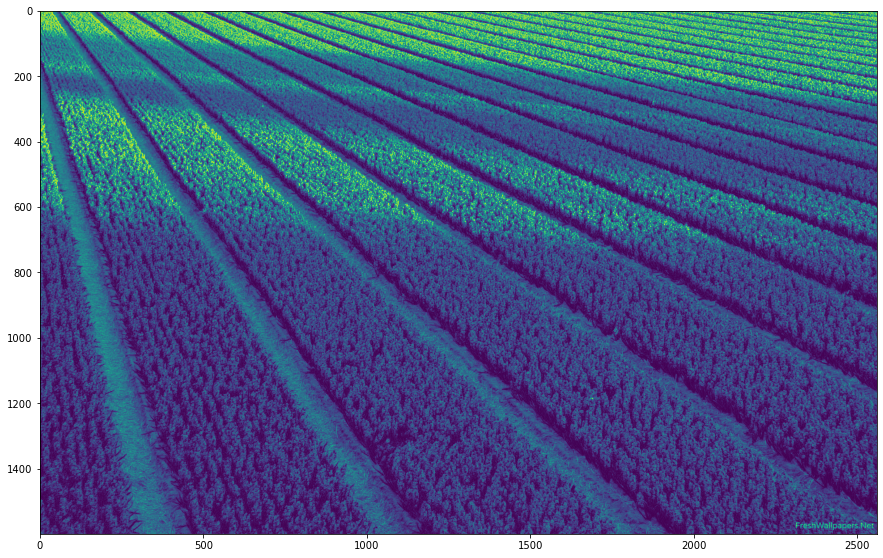

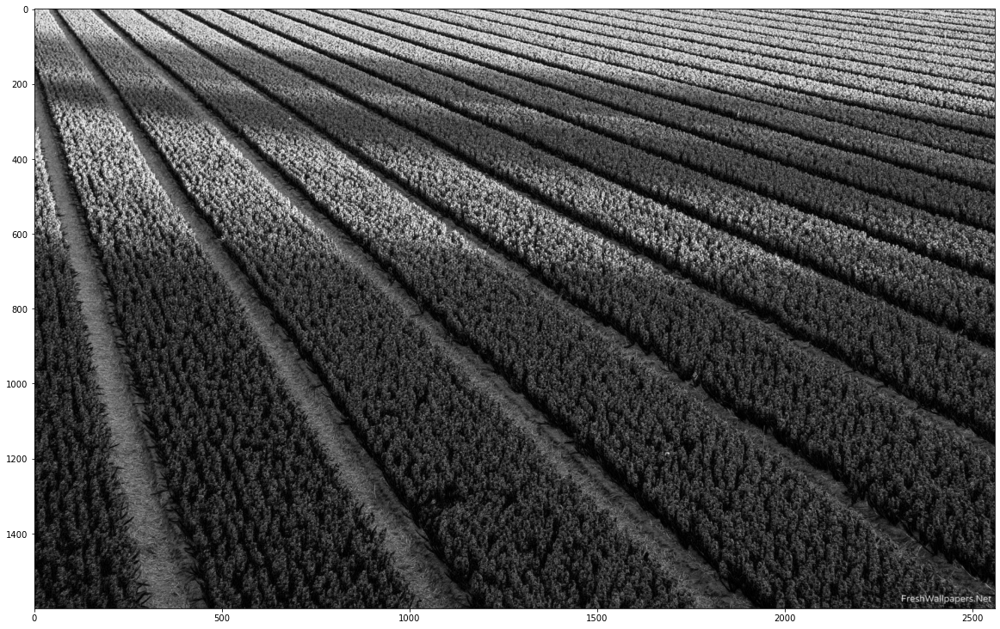

In [56]:
# Show each channel channel on screen
showimage(b_img) #why all green ??
#showimage(g_img)
#showimage(r_img)
plt.figure(figsize = (20,15))
plt.imshow(b_img, cmap='gray')

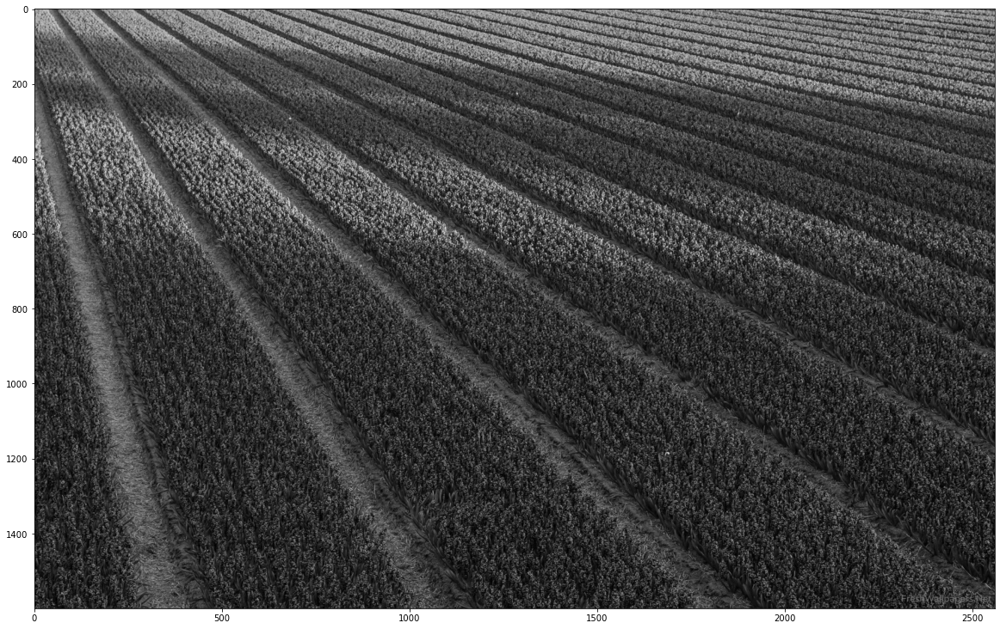

In [39]:
plt.figure(figsize = (20,15));
plt.imshow(g_img, cmap='gray');

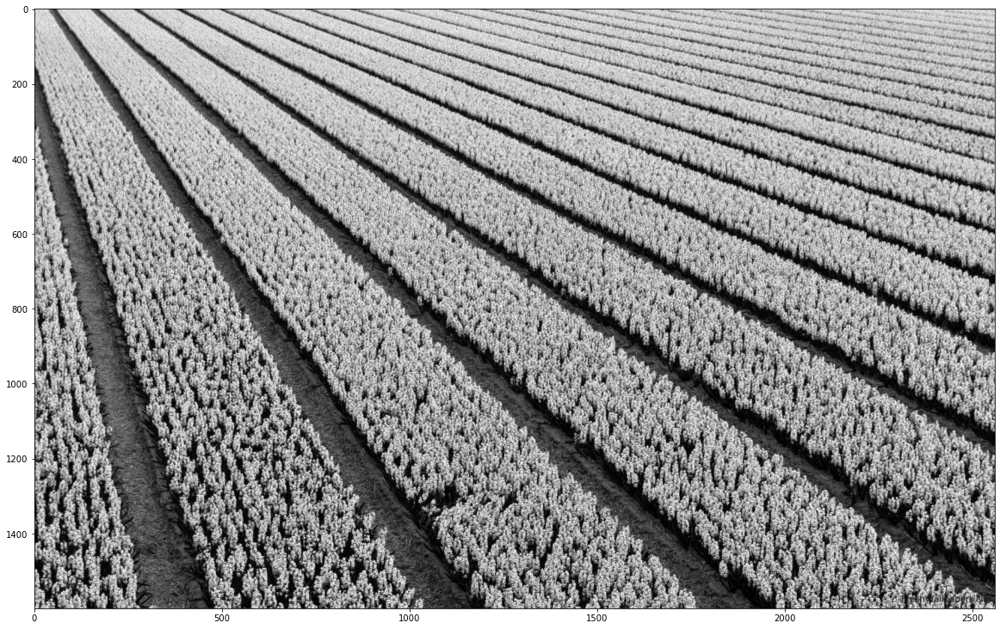

In [40]:
plt.figure(figsize = (20,15));
plt.imshow(r_img, cmap='gray');

#### Merging the color channels

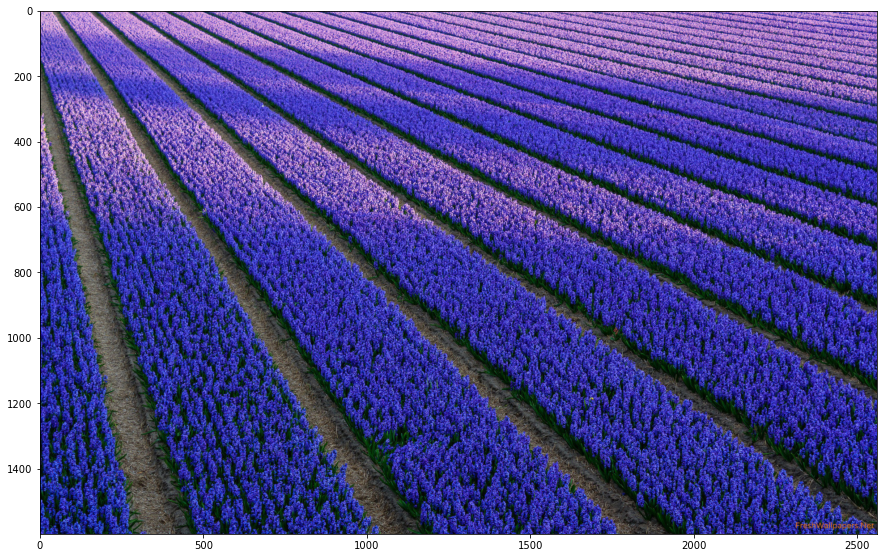

In [16]:
# Modify a channel and then merge them all again
img = cv2.merge((b_img,g_img,r_img))
showimage(img)

[Hint](# "cv2.merge") 

In [37]:
# Create a black canvas with the same size as the image you loaded
black_canvas = np.zeros(flowers_copy.shape[:2],dtype='uint8')
print(black_canvas.shape)
black_canvas

(1600, 2560)


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

[Hint](# "use numpy np.zeros function with the img.shape[:2]") 

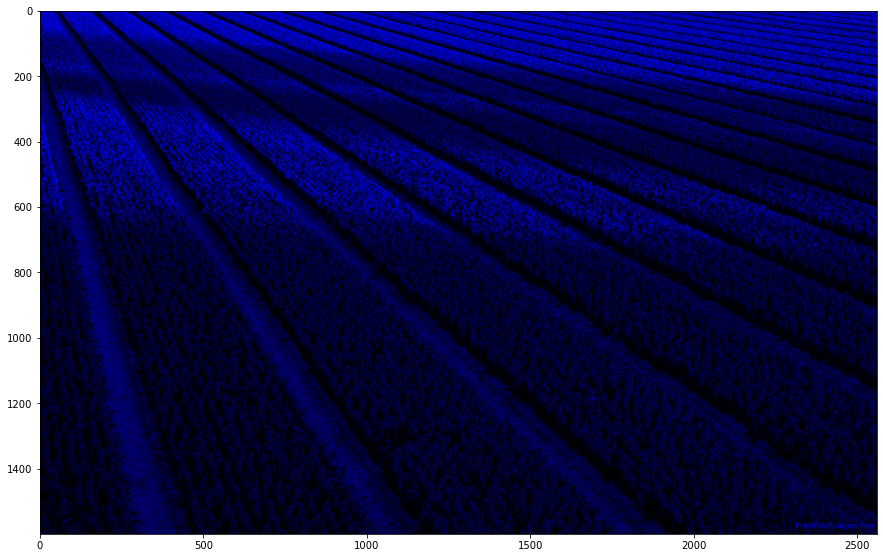

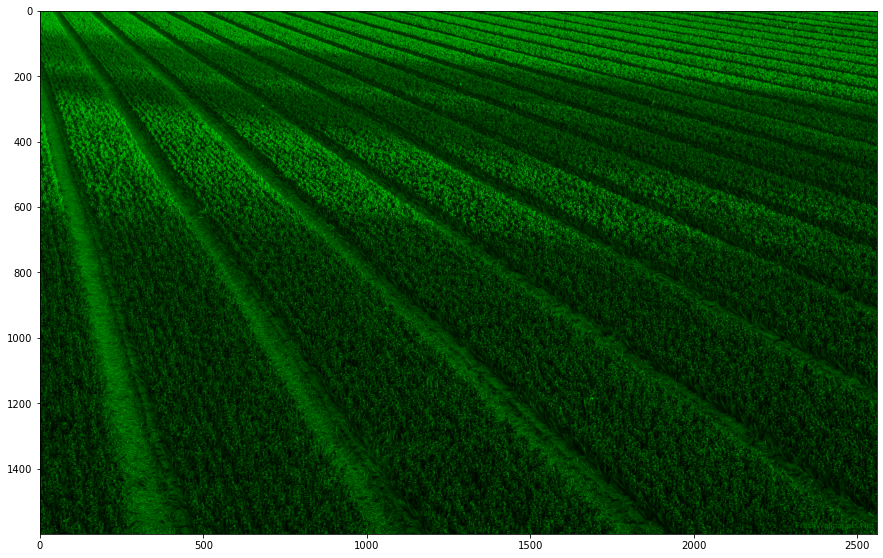

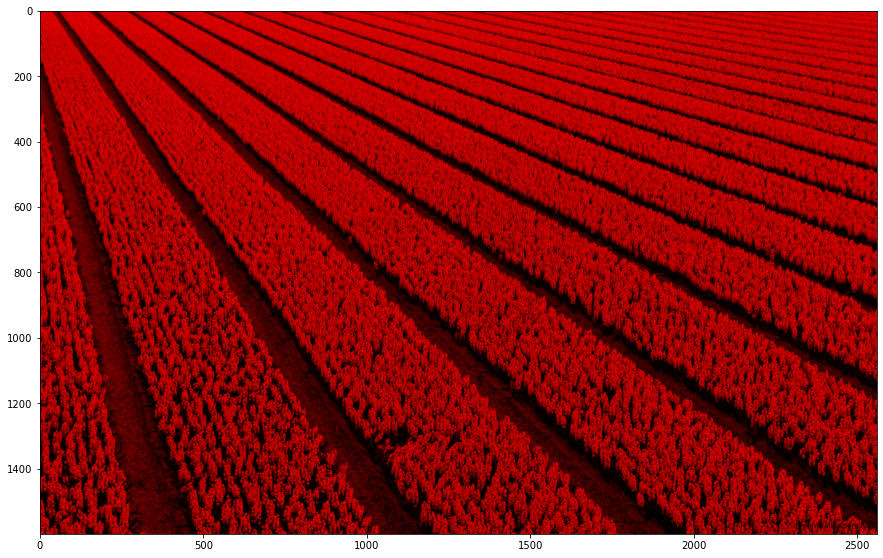

In [31]:
# Merge each channel with the black canvas 
# So you will end up with 3 images: (Red,Black,Black), (Black,Green,Black) and (Black,Black,Blue) 
# Assuming you are working with RGB, but BGR is also fine
img_blue_black = cv2.merge((black_canvas,black_canvas,b_img))
showimage(img_red_black)

img_green_black = cv2.merge((black_canvas,g_img,black_canvas))
showimage(img_green_black)

img_red_black = cv2.merge((r_img,black_canvas,black_canvas))
showimage(img_red_black)

[Hint](# "cv2.merge") 

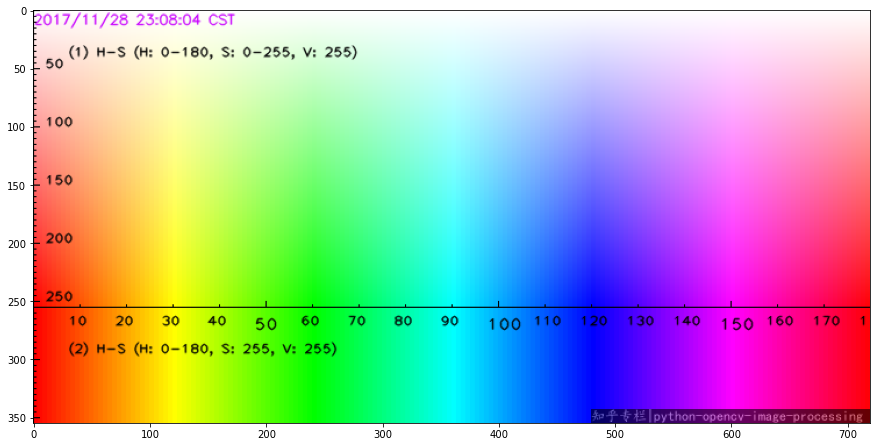

In [45]:
hsv_map = cv2.imread('img/hsv.png')
hsv_map = cv2.cvtColor(hsv_map,cv2.COLOR_BGR2RGB)
showimage(hsv_map)

### HSV: Hue Saturation Value

#### M&Ms challenge!

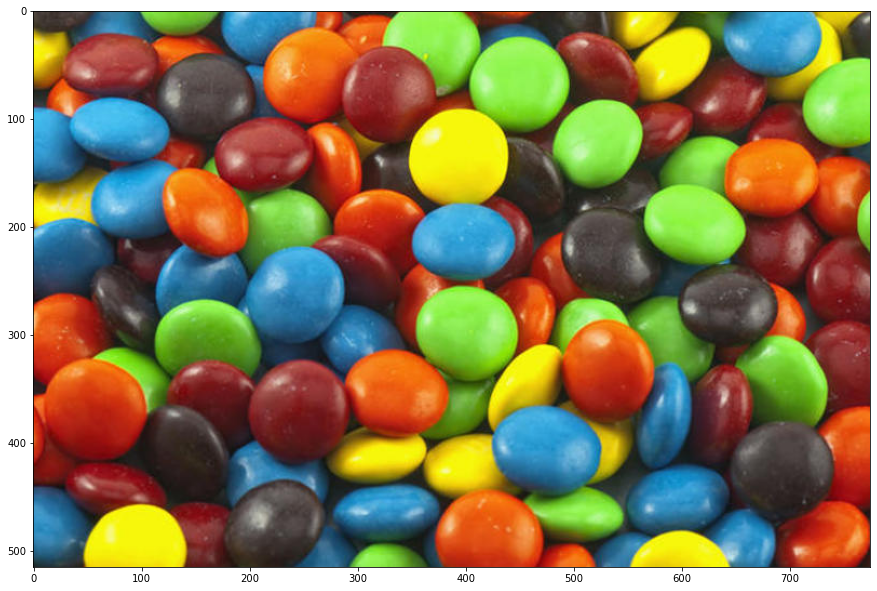

In [59]:
# Use the image below and convert it from BGR to HSV
img = cv2.imread('img/m.jpg')
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
showimage(rgb_img)

In [60]:
# Split the H,S and V channels 
hsv_img=cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
H, S, V = cv2.split(hsv_img)

[Hint](# "cv2.cvtColor") 

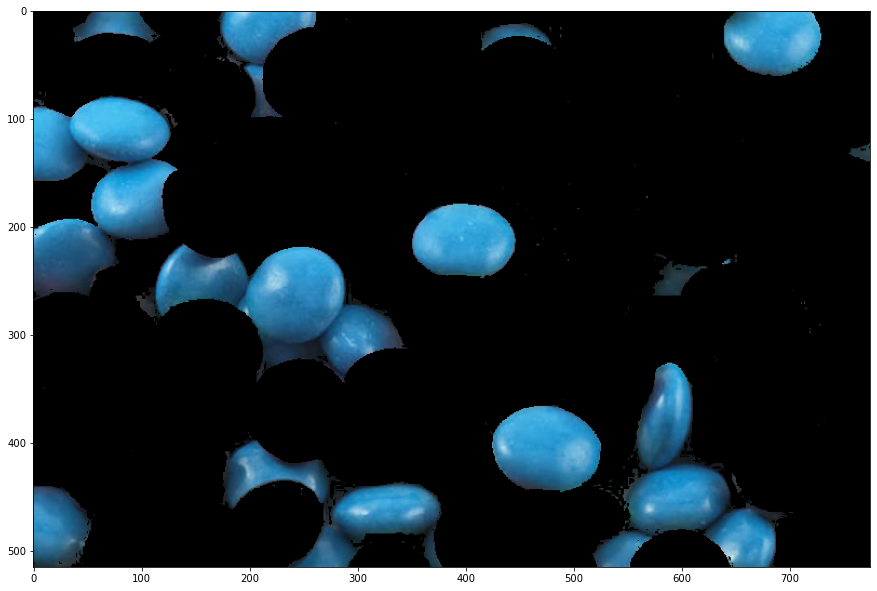

In [67]:
# Create a mask to filter out the Blue M&Ms (remember you need a lower and upper range)
# Make a copy of the hsv image and apply the mask to it, then display the image
lower_range = (90,20,0)
upper_range = (140,255,255)

mask = cv2.inRange(hsv_img, lower_range, upper_range)

masked_mm_b = rgb_img.copy()

masked_mm_b[mask==0] = [0,0,0]
showimage(masked_mm_b)

[Hint](# "cv2.inRange") 

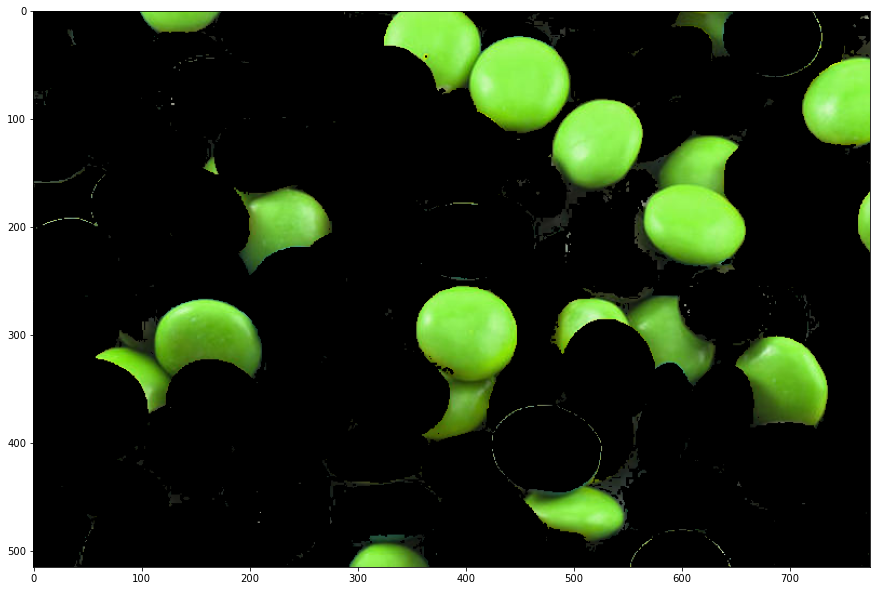

In [69]:
# Repeat the same but now with the greens
lower_range = (35,20,0)
upper_range = (80,255,255)

mask = cv2.inRange(hsv_img, lower_range, upper_range)

masked_mm_g = rgb_img.copy()

masked_mm_g[mask==0] = [0,0,0]
showimage(masked_mm_g)

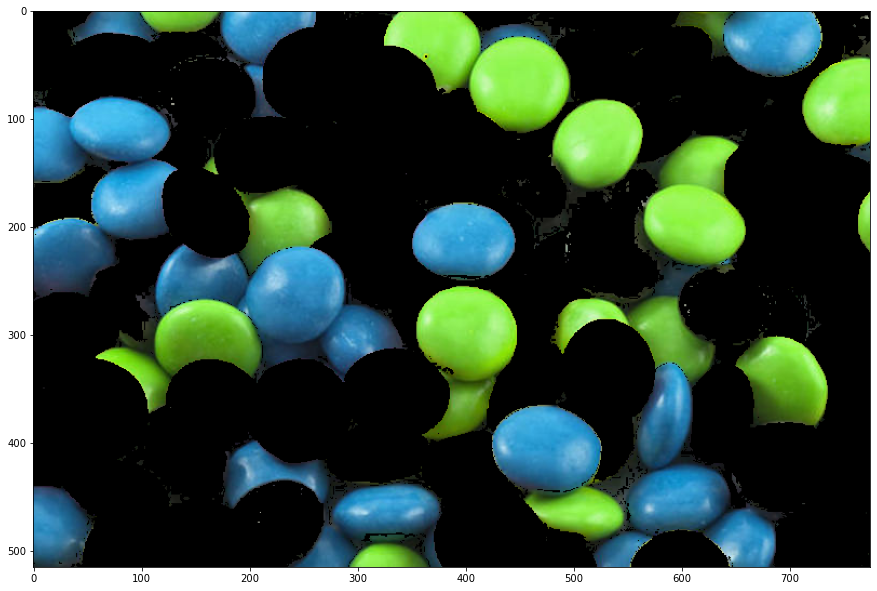

In [70]:
# Now combine both masks togheter so we can see all greens and blues in the same image!


# make list
masks = [masked_mm_b, masked_mm_g]

# add masks
h, w, c = masked_mm_b.shape
filter_gb = np.full((h,w,c), (0,0,0), dtype=np.uint8)

for mask in masks:
    filter_gb = cv2.add(filter_gb, mask)

# show results
#plt.figure(figsize = (10,7));
#plt.imshow(cv2.cvtColor(filter_gb, cv2.COLOR_BGR2RGB));
showimage(filter_gb)


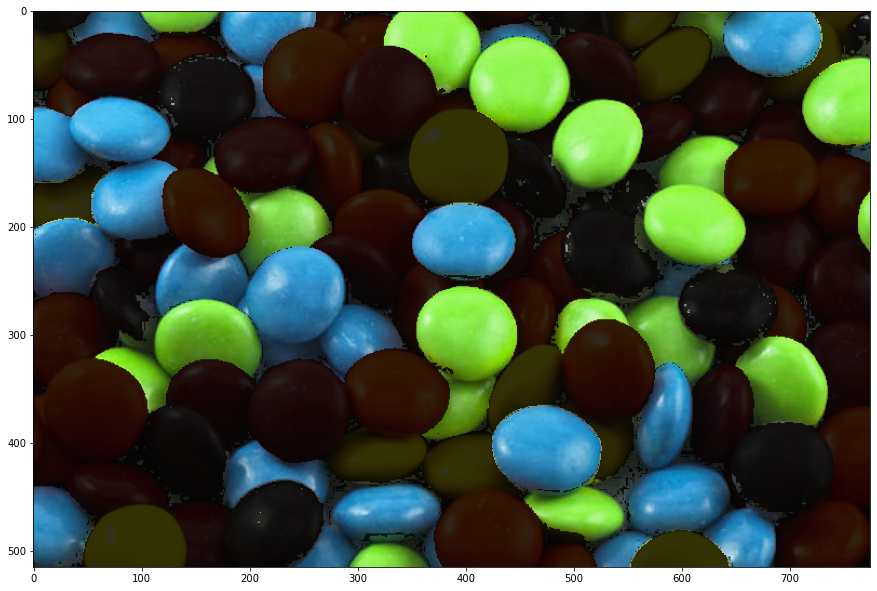

In [73]:
# Now lets combine both masks but also some opacity, we want to be able to see all M&Ms but
# Blues and greens will show as int he image above while the other colors will be faded out with some opacity
# You just need to add alpha to apply opacity to the dark parts of the mask, then display the image
copy_mm=rgb_img.copy()
overlay = filter_gb.copy()

opacity =0.2
img_2w = cv2.addWeighted(copy_mm,opacity,overlay,1-opacity,0)
showimage(img_2w)


[Hint](# "cv2.addWeighted") 

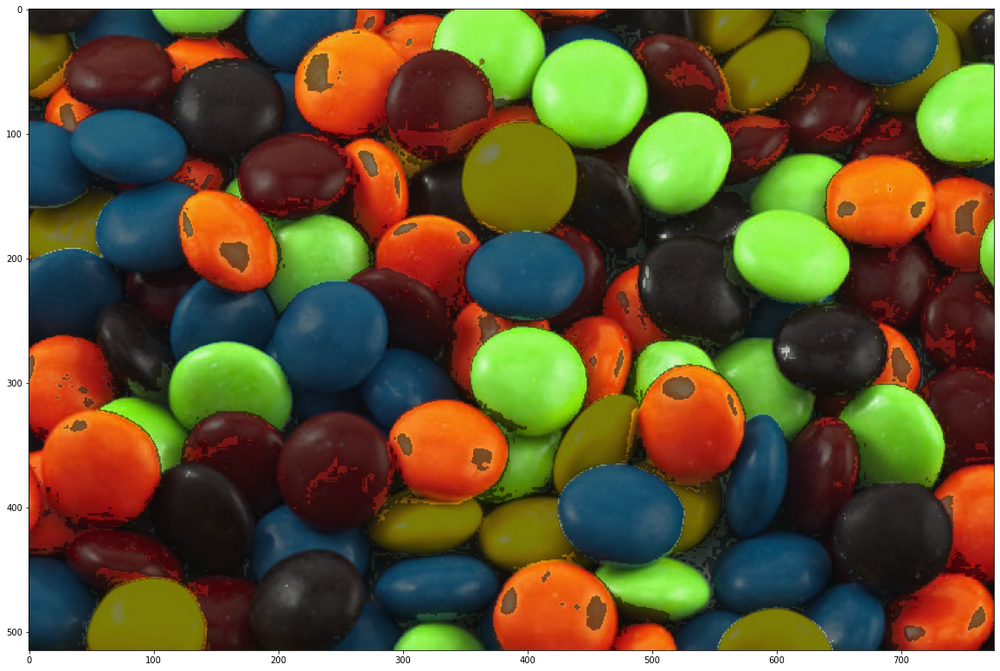

In [9]:
# Below you will find an example with oranges and greens just for reference so you can see what we want to accomplish
# In this example the oranges are not perfect, and it can be improved a lot easily.

## Mini project

### Level 1

#### Ball tracker

1. Given an image with a ball on it isolate the ball

### Level 2

#### Ball tracker

1. Make it track a ball in real time (either with a video or a webcam)

In [2]:


# CAPTURE VIDEO
lower_yellow = (20, 50, 6)
upper_yellow = (70, 255, 255)

video = cv2.VideoCapture(0)

while(video.isOpened()):
    check, frame = video.read()
    if frame is not None:
        # img = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        img = frame
        hsv_m = cv2.cvtColor(img, cv2.COLOR_BGR2HSV) 


        lower_yellow = (20, 50, 6)
        upper_yellow = (70, 255, 255)
        
        yellow_filter = cv2.inRange(hsv_m, lower_yellow, upper_yellow)
        masked_img = img.copy()

        masked_img[yellow_filter == 0] = [0, 0, 0]


        cv2.imshow('frame',masked_img)
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break
    else:
        break

#  rgba(170,177,38,255)
video.release()
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

### Level 3

#### Ball Tracker

1. Can you make it track two or more different color balls at the same time?

-1